In [1]:
import pandas as pd
import numpy as np
import os

from bs4 import BeautifulSoup
import pandas as pd

import time
from requests import Session
import sys 
import re
from tqdm import tqdm
tqdm.pandas(desc="progress-bar")

from gensim.models.ldamodel import LdaModel
from gensim.models.coherencemodel import CoherenceModel
from gensim.models import Word2Vec
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from bertopic.vectorizers import ClassTfidfTransformer
from bertopic.dimensionality import BaseDimensionalityReduction
from sklearn.linear_model import LogisticRegression
from bertopic.backend import WordDocEmbedder

import gensim.downloader as api
from gensim.utils import simple_preprocess
from gensim.corpora import Dictionary
from gensim.models import TfidfModel
from gensim.similarities import WordEmbeddingSimilarityIndex

from re import sub
from multiprocessing import cpu_count

from gensim.similarities import SparseTermSimilarityMatrix
from gensim.similarities import SoftCosineSimilarity

from xgboost import XGBClassifier
import argparse
from keybert import KeyBERT
from sklearn.metrics.pairwise import cosine_similarity

from autocorrect import Speller
import tldextract

from itertools import combinations
from nltk import skipgrams
import umap

import matplotlib.pyplot as plt
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
import seaborn as sns
import matplotlib as mpl
from pylab import rcParams
sns.set(font_scale=1.5)
sns.set_style("whitegrid")
sns.set_theme(style='white')
#% matplotlib inline
from datetime import datetime

import plotly.graph_objs as go
import plotly.offline as pyo
import plotly.figure_factory as ff
import plotly.express as px
from plotly import tools
from plotly.subplots import make_subplots
from plotly.offline import iplot

from textblob import TextBlob, Word, Blobber
from textblob.classifiers import NaiveBayesClassifier
from textblob.taggers import NLTKTagger
from bertopic.vectorizers import ClassTfidfTransformer

import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.stem.porter import PorterStemmer 
from nltk.stem import WordNetLemmatizer
nltk.download('omw-1.4')
from nltk.tokenize import word_tokenize
nltk.download('maxent_ne_chunker')
nltk.download('words')

import spacy
nlp = spacy.load('en_core_web_sm')

from gensim.models import word2vec
import pickle
import gzip
import argparse
import torch
from transformers import BertTokenizer, BertModel
from bertopic.representation import KeyBERTInspired
from bertopic.representation import MaximalMarginalRelevance
from bertopic.representation import PartOfSpeech

import dgl

import string
import gensim
import collections
from gensim.corpora import Dictionary
import difflib 
from matplotlib_venn import venn3
from venn import venn
from sklearn.preprocessing import LabelEncoder

from tqdm import tqdm
tqdm.pandas(desc="progress-bar")

from gensim.models.ldamodel import LdaModel
from gensim.models.coherencemodel import CoherenceModel
from gensim.models import Word2Vec
from sklearn.decomposition import PCA
from bertopic import BERTopic
import openai
#from bertopic.representation import OpenAI
from sentence_transformers import SentenceTransformer
import hdbscan
from top2vec import Top2Vec

from autocorrect import Speller
from itertools import combinations
from nltk import skipgrams

from bs4 import BeautifulSoup
import requests
import csv
import time

import itertools
import collections
import re
import logging
from re import sub

from fuzzywuzzy import process, fuzz
from networkx.algorithms.community.centrality import girvan_newman

# Import and download stopwords from NLTK.
nltk.download('stopwords')  # Download stopwords list.
stopwords = set(nltk.corpus.stopwords.words("english"))

import networkx as nx
from networkx.algorithms.community.centrality import girvan_newman
from itertools import chain

import string
import gc
import warnings
warnings.filterwarnings('ignore')

import logging

# Initialize logging.
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.WARNING)  # DEBUG # INFO

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/aditidutta/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /Users/aditidutta/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     /Users/aditidutta/nltk_data...
[nltk_data]   Package maxent_ne_chunker is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     /Users/aditidutta/nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/aditidutta/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
# Function to reverse the names of the authors in the naming list for each databases
# this is because they are included in the dataset differently

def rev_author_names(x):
    names = ''
    for key, value in enumerate(x):
        value = value.split(" ")
        first = str(value[0])
        second = str(" ".join(value[1:]))
        name = second + ' ' + first
        names = "; ".join([names, name]).lstrip().lstrip(';')
    return names

string = 'Ritesh Kumar, Enakshi Nandi Roy'
test = "".join(rev_author_names(string.split(", ")))
test

'Kumar Ritesh; Nandi Roy Enakshi'

In [3]:
# Only keeping the surname of the author and the initials of the first and middle names

def init_auth_names(x):
    names = ''
    for key, value in enumerate(x):
        value = value.strip().split(" ")
        initials = value[:-1]
        surname = value[-1]
        words = ''
        for each in initials:
            each = each.capitalize()
            each = each[0]
            each = str(each) + '.'
            words = " ".join([words, each])
        name = words + ' ' + surname
        names = ";".join([names, name]).strip().lstrip(';')
    return names

string = 'Hendrik Burwinkel; Matthias ok Keicher; D. Jok Bani-Harouni; T. Zellner; F. Eyer; N. Navab'
test = "".join(init_auth_names(string.split("; ")))
test

'H. Burwinkel; M. O. Keicher; D. J. Bani-Harouni; T. Zellner; F. Eyer; N. Navab'

In [4]:
def add_space_auth(x):
    names = ''
    for key, value in enumerate(x):
        value = value.split(" ")
        first = str(value[0])
        second = str(" ".join(value[1:]))
        second = second.replace('.', '. ').rstrip()
        name = first + ' ' + second
        names = "; ".join([names, name]).lstrip().lstrip(';')
    return names

string = 'Ta H.T.; Rahman A.B.S.; Najjar L.; Gelbukh A.'

test = "".join(add_space_auth(string.split("; ")))
test

'Ta H. T.; Rahman A. B. S.; Najjar L.; Gelbukh A.'

In [5]:
######################### ArXiv ###########################

df1 = pd.read_csv('arxiv_data.csv')

# Removing the nan values
df1[['author_1_name', 'author_2_name', 'author_3_name', 'author_4_name', 'author_5_name', 'author_6_name']] = df1[['author_1_name', 'author_2_name', 'author_3_name', 'author_4_name', 'author_5_name', 'author_6_name']].fillna('')

# Merging all the columns together for the authors
df1['authors'] = df1[['author_1_name', 'author_2_name', 'author_3_name', 'author_4_name', 'author_5_name', 'author_6_name']].astype(str).apply(lambda x: '; '.join(x), axis=1)
# removing trailing commas and extra spaces
df1['authors'] = df1['authors'].apply(lambda x: x.rstrip('; '))
df1['authors'] = df1['authors'].apply(lambda x: "".join(init_auth_names(x.split("; "))))

df1 = df1[df1['Title'].notna()]
df1 = df1[['Title', 'Abstract', 'Venue', 'Year', 'Open_Access', 'fieldsOfStudy', 'Publication_Type', 'authors']]
df1


,Title,Abstract,Venue,Year,Open_Access,fieldsOfStudy,Publication_Type,authors
0,Benchmark dataset of memes with text transcrip...,NaN,Data in Brief,2021,False,"Medicine, Computer Science",JournalArticle,F. Gasparini; G. Rizzi; A. Saibene; E. Fersini
1,Wearing Many (Social) Hats: How Different Are ...,\n \n This paper investigates when users creat...,International Conference on Web and Social Media,2017,True,"Computer Science, Psychology",JournalArticle,C. Zhong; H. Chang; D. Karamshuk; D. Lee; N. R...
2,When a Tweet is Actually Sexist. A more Compre...,Sexism is very common in social media and make...,ArXiv,2019,False,Computer Science,JournalArticle,S. Sharifirad; S. Matwin
3,#ILookLikeAnEngineer: Using Social Media Based...,"Each year, significant investment of time and ...",ArXiv,2018,False,"Computer Science, Sociology",JournalArticle,A. Malik; A. Johri; R. Handa; H. Karbasian; H....
4,The ComMA Dataset V0.2: Annotating Aggression ...,"In this paper, we discuss the development of a...",International Conference on Language Resources...,2021,False,Computer Science,JournalArticle,R. Kumar; E. Nandi; L. N. Devi; S. Ratan; S. S...
...,...,...,...,...,...,...,...,...
275,Adaptive image-feature learning for disease cl...,NaN,International Conference on Medical Image Comp...,2019,True,"Computer Science, Engineering, Mathematics",JournalArticle,H. Burwinkel; A. Kazi; G. Vivar; S. Albarqouni...
276,Decision Support for Intoxication Prediction U...,NaN,International Conference on Medical Image Comp...,2020,True,Computer Science,JournalArticle,H. Burwinkel; M. Keicher; D. Bani-Harouni; T. ...
277,Mitigating Biases in Student Performance Predi...,Traditional learning-based approaches to stude...,International Conference on Information and Kn...,2022,True,Computer Science,"JournalArticle, Book, Conference",Y. Chu; S. Hosseinalipour; E. Tenorio; L. Cruz...
278,Pre-Trained Language Transformers are Universa...,Facial images disclose many hidden personal tr...,ArXiv,2022,False,Computer Science,JournalArticle,R. Goel; M. Sulaiman; K. Noorbakhsh; M. Sharif...


In [6]:
df1['authors'].iloc[276]

'H. Burwinkel; M. Keicher; D. Bani-Harouni; T. Zellner; F. Eyer; N. Navab'

In [7]:
### Elsevier ###########################

df2 = pd.read_csv('elsevier_data.csv')

# Has TLDR which is not useful for the analysis anyway

# Removing the word abstract in various forms
df2['Abstract'] = df2['Abstract'].astype(str).apply(lambda x: re.sub(r'^ABSTRACT ', '', x))
df2['Abstract'] = df2['Abstract'].astype(str).apply(lambda x: re.sub(r'^ABSTRACT. ', '', x))
df2['Abstract'] = df2['Abstract'].astype(str).apply(lambda x: re.sub(r'^Abstract ', '', x))

# Removing the nan values
df2[['author_1_name', 'author_2_name', 'author_3_name', 'author_4_name', 'author_5_name', 'author_6_name']] = df2[['author_1_name', 'author_2_name', 'author_3_name', 'author_4_name', 'author_5_name', 'author_6_name']].fillna('')

# Merging all the columns together for the authors
df2['authors'] = df2[['author_1_name', 'author_2_name', 'author_3_name', 'author_4_name', 'author_5_name', 'author_6_name']].astype(str).apply(lambda x: '; '.join(x), axis=1)
# removing trailing commas and extra spaces
df2['authors'] = df2['authors'].apply(lambda x: x.rstrip('; '))
df2['authors'] = df2['authors'].apply(lambda x: "".join(init_auth_names(x.split("; "))))
df2 = df2[df2['Title'].notna()]

df2 = df2[['Title', 'Abstract', 'Venue', 'Year', 'Open_Access', 'fieldsOfStudy', 'Publication_Type', 'authors']]
df2

,Title,Abstract,Venue,Year,Open_Access,fieldsOfStudy,Publication_Type,authors
0,The Scale of Ethical Attitude toward Ethnic Hu...,Research on ethnic humor has been centered on ...,NaN,2013,True,Psychology,NaN,E. F. Haghish; A. Heydari; G. Pfuhl; R. Biegle...
1,A Feminist Pentecostal Theological Anthropolog...,In this article I focus on developing a femini...,NaN,2013,False,Sociology,NaN,L. P. Stephenson
2,Dying to Get Out of the Asylum: Mortality and ...,This article examines the status of lunatic ca...,Bulletin of The History of Medicine,2013,False,Medicine,JournalArticle,D. Wright; L. Jacklin; T. Themeles
3,"Citizenship without representation? Blackface,...",This article explores Die Antwoord's blackface...,NaN,2013,False,Sociology,NaN,A. Haupt
4,"Schools, Sex Education, and Support for Sexual...",School-based adolescent sexual health educatio...,NaN,2013,False,Psychology,Review,D. McCarty-Caplan
...,...,...,...,...,...,...,...,...
1376,"Body, Eugenics and Nationalism: Women in the F...",This research analyses images of the female bo...,NaN,2014,False,Sociology,NaN,J. Greve
1377,What Looks Like Sexism and Why? The Effect of ...,Sexist comments are not perceived equally in t...,The Journal of general psychology,2014,False,Sociology,JournalArticle,I. Osthus; V. Sewpaul
1378,The Standardized Experimental Situation in Exp...,nan,NaN,2014,False,Sociology,NaN,T. Deželan; D. F. Hafner; M. Melink
1379,Playing Games and Asking Questions in a Non-WE...,A recent debate across the social sciences que...,NaN,2014,False,"Medicine, Economics","JournalArticle, Review",M. Balaev


In [8]:
### Google Scholar ###########################

df3 = pd.read_csv('gscholar_data.csv')

### Work on the abstracts first

# Has TLDR which is useful, and might be worth replacing it in place of the abstract
df3['Abstract'] = df3['Abstract'].fillna(df3.pop('TLDR'))

# Now remove the word 'ABSTRACT' from some of them
df3['Abstract'] = df3['Abstract'].astype(str).apply(lambda x: re.sub(r'^ABSTRACT ', '', x))

# Removing the nan values
df3[['author_1_name', 'author_2_name', 'author_3_name', 'author_4_name', 'author_5_name', 'author_6_name']] = df3[['author_1_name', 'author_2_name', 'author_3_name', 'author_4_name', 'author_5_name', 'author_6_name']].fillna('')

# Merging all the columns together for the authors
df3['authors'] = df3[['author_1_name', 'author_2_name', 'author_3_name', 'author_4_name', 'author_5_name', 'author_6_name']].astype(str).apply(lambda x: '; '.join(x), axis=1)
# removing trailing commas and extra spaces
df3['authors'] = df3['authors'].apply(lambda x: x.rstrip('; '))
df3['authors'] = df3['authors'].apply(lambda x: "".join(init_auth_names(x.split("; "))))

# Changing the name of the 'title' column to match with others
df3 = df3.rename(columns={'title': 'Title'})
df3 = df3[df3['Title'].notna()]

# Convert the year from float to int
df3['Year'] = df3['Year'].apply(lambda x: np.array(x, dtype=int))

df3 = df3[['Title', 'Abstract', 'Venue', 'Year', 'Open_Access', 'fieldsOfStudy', 'Publication_Type', 'authors']]

df3

,Title,Abstract,Venue,Year,Open_Access,fieldsOfStudy,Publication_Type,authors
0,Hateful Symbols or Hateful People? Predictive ...,Hate speech in the form of racist and sexist r...,North American Chapter of the Association for ...,2016,True,Computer Science,"JournalArticle, Conference",Z. Talat; D. Hovy
1,Analyzation and Detection of Cyberbullying: A ...,This research aims at analyzing Cyberbullying ...,NaN,2017,False,Sociology,NaN,A. Sahni; N. Raja
2,SIRI-OUSLY 2.0: What artificial intelligence r...,The First Amendment may protect speech by stro...,NaN,2017,False,Sociology,NaN,T. Massaro; H. L. Norton; M. Kaminski
3,Relationships between Ambivalent Sexism and th...,Ambivalent sexism has served to justify and ma...,The Journal of psychology,2017,False,"Psychology, Medicine",JournalArticle,M. L. Vecina; R. Piñuela
4,Age Differences in Online Communication: How C...,"With the most recent US Presidential election,...",NaN,2017,True,Psychology,Review,L. T. Wolfer
...,...,...,...,...,...,...,...,...
1601,Computer Aided Diagnosis of Melanoma Using Dee...,Early detection of melanoma remains a daily ch...,International Journal of Molecular Sciences,2022,True,Medicine,JournalArticle,A. F. Gouabou; J. Collenne; J. Monnier; R. Igu...
1602,Transgender Identity Is Associated With Bullyi...,"Background During adolescence, bullying often ...",Frontiers in Psychology,2021,True,Medicine,JournalArticle,E. Heino; N. Ellonen; R. Kaltiala
1603,On the practical teaching of Business German t...,"In theory, skopos theory belongs to functional...",NaN,2020,False,Sociology,NaN,W. Wen-jun
1604,Weaving Privacy and Power: On the Privacy Prac...,We investigate the privacy practices of labor ...,ArXiv,2022,False,Computer Science,JournalArticle,S. Kapoor; M. Sun; M. Wang; K. Ja'zwi'nska; E....


In [9]:
type(df1['Year'].iloc[0]), type(df2['Year'].iloc[0]), type(df3['Year'].iloc[0])

(numpy.int64, numpy.int64, numpy.int64)

In [10]:
### Scopus ###########################

df4_1 = pd.read_csv('scopus_cs.csv')
df4_1['fieldsOfStudy'] = 'Computer Science'

df4_2 = pd.read_csv('scopus_ah.csv')
df4_2['fieldsOfStudy'] = 'Arts and Humanities'

df4_3 = pd.read_csv('scopus_ds.csv')
df4_3['fieldsOfStudy'] = 'Decision Sciences'

df4_4 = pd.read_csv('scopus_engg.csv')
df4_4['fieldsOfStudy'] = 'Engineering'

df4_5 = pd.read_csv('scopus_multidisc.csv')
df4_5['fieldsOfStudy'] = 'Multidisciplinary'

df4_6 = pd.read_csv('scopus_psychology.csv')
df4_6['fieldsOfStudy'] = 'Psychology'

df4_7 = pd.read_csv('scopus_social_science.csv')
df4_7['fieldsOfStudy'] = 'Social Sciences'

df4_8 = pd.read_csv('scopus_maths.csv')
df4_8['fieldsOfStudy'] = 'Mathematics'

df4 = pd.concat([df4_1, df4_2, df4_3, df4_4, df4_5, df4_6, df4_7, df4_8], axis=0)


# Merging all the columns together for the authors
#df4['authors'] = df4[['author_1_name', 'author_2_name', 'author_3_name', 'author_4_name', 'author_5_name', 'author_6_name']].astype(str).apply(lambda x: ', '.join(x), axis=1)
# removing trailing commas and extra spaces
df4['Authors'] = df4['Authors'].apply(lambda x: "".join(add_space_auth(str(x).split("; "))))
df4['Authors'] = df4['Authors'].apply(lambda x: "".join(rev_author_names(x.split("; "))))

df4['Open_Access'] = np.where(df4['Open Access'].isna(), False, True)

df4 = df4.rename(columns={'title': 'Title', 'Authors': 'authors', 'Document Type': 'Publication_Type', 'Source title': 'Venue'})
#df4 = df4[df4['Title'].notna()]

df4['Year'] = df4['Year'].apply(lambda x: np.array(x, dtype=int))

df4 = df4[['Title', 'Abstract', 'Venue', 'Year', 'Open_Access', 'fieldsOfStudy', 'Publication_Type', 'authors']]

df4['Publication_Type'].unique() # Article', 'Conference Paper', 'Review', 'Book', 'Conference Review', 'Book Chapter', 'Data Paper'
df4['Publication_Type'] = np.where(df4['Publication_Type'] == 'Conference Paper', 'Conference', df4['Publication_Type'])
df4['Publication_Type'] = np.where(df4['Publication_Type'] == 'Conference Review', 'Conference, Review', df4['Publication_Type'])
df4['Publication_Type'] = np.where(df4['Publication_Type'] == 'Book Chapter', 'Book', df4['Publication_Type'])
df4['Publication_Type'] = np.where(df4['Publication_Type'] == 'Data Paper', 'Study', df4['Publication_Type'])
df4['Publication_Type'] = np.where(df4['Publication_Type'] == 'Article', 'JournalArticle', df4['Publication_Type'])

df4

,Title,Abstract,Venue,Year,Open_Access,fieldsOfStudy,Publication_Type,authors
0,Transfer Learning for Automatic Sexism Detecti...,In recent years sexism has become an increasin...,CEUR Workshop Proceedings,2022,False,Computer Science,Conference paper,D. Liakhovets; M. Schütz; J. Böck; M. Andresel...
1,Transfer Learning from Multilingual DeBERTa fo...,"In this paper, we address the Task 1 and Task ...",CEUR Workshop Proceedings,2022,False,Computer Science,Conference paper,H. T. Ta; A. B. S. Rahman; L. Najjar; A. Gelbukh
2,DD-TIG at SemEval-2022 Task 5: Investigating t...,This paper describes our submission for task 5...,SemEval 2022 - 16th International Workshop on ...,2022,False,Computer Science,Conference paper,Z. Zhou; H. Zhao; J. Dong; N. Ding; X. Liu; K....
3,SRCB at SemEval-2022 Task 5: Pretraining Based...,Online misogyny meme detection is an image/tex...,SemEval 2022 - 16th International Workshop on ...,2022,False,Computer Science,Conference paper,Y. Wang; J. Zhang; B. Peng; X. Zhang; X. Qu; Y...
4,QiNiAn at SemEval-2022 Task 5: Multi-Modal Mis...,"In this paper, we describe our submission to t...",SemEval 2022 - 16th International Workshop on ...,2022,False,Computer Science,Conference paper,Q. Gu; N. Meisinger; A. -K. Dick
...,...,...,...,...,...,...,...,...
81,Gender politics in the 2016 U.S. presidential ...,Gender plays an important role in the 2016 U.S...,Lecture Notes in Computer Science (including s...,2017,True,Mathematics,Conference paper,Y. Wang; Y. Feng; J. Luo
82,Ten Simple Rules to Achieve Conference Speaker...,[No abstract available],PLoS Computational Biology,2014,True,Mathematics,JournalArticle,Martin J. L.
83,YMAI at SemEval-2022 Task 5: Detecting Misogyn...,This paper presents a deep learning system tha...,SemEval 2022 - 16th International Workshop on ...,2022,False,Mathematics,Conference paper,M. Habash; Y. Daqour; M. Abdullah; M. Al-Ayyoub
84,Mathematical model of gender bias and homophil...,Women have become better represented in busine...,Chaos,2019,True,Mathematics,JournalArticle,S. M. Clifton; K. Hill; A. J. Karamchandani; E...


In [11]:
df4['authors'].iloc[1]

'H. T. Ta; A. B. S. Rahman; L. Najjar; A. Gelbukh'

In [12]:
### Semantic Scholar ###########################

df5 = pd.read_csv('sem_sco_data.csv')

df5 = df5.rename(columns={'title': 'Title', 'all_authors': 'authors', 'isOpenAccess': 'Open_Access', 'venue': 'Venue', 'abstract': 'Abstract', 'year': 'Year'})
df5 = df5[df5['Title'].notna()]

# Convert the year from float to int
#df5['Year'] = df5['Year'].apply(lambda x: np.array(x, dtype=int))

df5['authors'] = df5['authors'].apply(lambda x: "".join(init_auth_names(str(x).split(", "))))

len(df5['book_title'].unique()), len(df5['journal'].unique()), len(df5) # (1562, 1663, 9900)

# Checking if values can exist in both, neither or either
df5[['book_title', 'journal']].isnull().sum(axis=1).unique() # array([0, 1, 2])

df5['Publication_Type_1'] = np.where(df5['book_title'].isna(), '', 'Book')
df5['Publication_Type_2'] = np.where(df5['journal'].isna(), '', 'JournalArticle')

# join both of the columns and strip the space and comma from there
df5['Publication_Type'] = df5[['Publication_Type_2', 'Publication_Type_1']].apply(lambda x: ', '.join(x).rstrip(", ").lstrip(", "), axis=1)
df5['Publication_Type'] = df5['Publication_Type'].replace('', np.nan, regex=True)

df5 = df5[['Title', 'Abstract', 'Venue', 'Year', 'Open_Access', 'fieldsOfStudy', 'Publication_Type', 'authors']]

df5

,Title,Abstract,Venue,Year,Open_Access,fieldsOfStudy,Publication_Type,authors
0,Anchor DETR: Query Design for Transformer-Base...,"In this paper, we propose a novel query design...",AAAI Conference on Artificial Intelligence,2022,True,Computer Science,"JournalArticle, Book",Y. Wang; X. Zhang; T. Yang; J. Sun
1,QMSum: A New Benchmark for Query-based Multi-d...,Meetings are a key component of human collabor...,North American Chapter of the Association for ...,2021,True,Computer Science,Book,M. Zhong; D. Yin; T. Yu; A. Zaidi; M. Mutuma
2,Square Attack: a query-efficient black-box adv...,NaN,European Conference on Computer Vision,2019,True,"Computer Science, Mathematics","JournalArticle, Book",M. Andriushchenko; F. Croce; N. Flammarion; M....
3,Vision-Language Transformer and Query Generati...,"In this work, we address the challenging task ...",IEEE International Conference on Computer Vision,2021,True,"Computer Science, Medicine","JournalArticle, Book",H. Ding; C. Liu; S. Wang; X. Jiang
4,HopSkipJumpAttack: A Query-Efficient Decision-...,The goal of a decision-based adversarial attac...,IEEE Symposium on Security and Privacy,2019,True,"Computer Science, Mathematics","JournalArticle, Book",J. Chen; M. I. Jordan
...,...,...,...,...,...,...,...,...
9895,Hadoop-GIS : A High Performance Spatial Query ...,Querying and analyzing large volumes of spatia...,NaN,2012,False,NaN,NaN,F. Wang; A. Aji; Q. Liu; J. Saltz
9896,A Gaussian process-based RRT planner for the e...,A new framework which adopts a rapidly-explori...,Adv. Robotics,2013,False,Computer Science,"JournalArticle, Book",K. Yang; S. K. Gan; S. Sukkarieh
9897,Enforcing k nearest neighbor query integrity o...,"Outsourcing spatial databases, including both ...",SIGSPATIAL/GIS,2012,False,Computer Science,"JournalArticle, Book",L. Hu; Y. Jing; W. Ku; C. Shahabi
9898,Query-based access control for secure collabor...,Large-scale model-driven system engineering pr...,ACM/IEEE International Conference on Model Dri...,2016,True,Computer Science,"JournalArticle, Book",G. Bergmann; C. Debreceni; I. Ráth; D. Varró


In [13]:
### Web of Science ###########################

df6 = pd.read_csv('wos_data.csv')

df6['Author Full Names'] = df6['Author Full Names'].apply(lambda x: "; ".join(x.replace(',', '').split('; ')))

df6['Publication Type'] = np.where((df6['Publication Type'] == 'J'), 'JournalArticle', df6['Publication Type'])
df6['Publication Type'] = np.where((df6['Publication Type'] == 'S'), 'JournalArticle, Book', df6['Publication Type'])
df6['Publication Type'] = np.where((df6['Publication Type'] == 'C'), 'Conference', df6['Publication Type'])

df6['Author Full Names'] = df6['Author Full Names'].apply(lambda x: "; ".join(x.replace(',', '').split('; ')))
df6['Author Full Names'] = df6['Author Full Names'].apply(lambda x: "".join(rev_author_names(x.split("; "))))
df6['Author Full Names'] = df6['Author Full Names'].apply(lambda x: "".join(init_auth_names(x.split("; ")))) 

df6 = df6.rename(columns={'Author Full Names': 'authors', 'Publication Type': 'Publication_Type', 'Article Title': 'Title', 
                          'Research Areas': 'fieldsOfStudy', 'Publication Year': 'Year', 'Conference Title': 'Venue'})
df6 = df6[df6['Title'].notna()]


df6['Open_Access'] = np.where(df6['Open Access Designations'].isna(), False, True)
df6['Publication_Type'] = np.where(df6['Document Type'].str.contains('Review'), 'Review', df6['Publication_Type'])
df6['Publication_Type'] = np.where(df6['Document Type'].str.contains('Meeting'), 'Study', df6['Publication_Type'])
df6['Publication_Type'] = np.where(df6['Document Type'] == 'Article; Proceedings Paper', 'JournalArticle, Conference', df6['Publication_Type'])
df6['Publication_Type'] = np.where(df6['Document Type'] == 'Article; Data Paper', 'JournalArticle, Study', df6['Publication_Type'])
df6['Publication_Type'] = np.where(df6['Document Type'] == 'Editorial Material', 'Editorial', df6['Publication_Type'])
df6['Publication_Type'] = np.where(df6['Document Type'] == 'Letter', 'LettersAndComments', df6['Publication_Type'])

df6['Publication_Type'].unique() # Publication Type (J=Journal; B=Book; S=Series; P=Patent)

df6 = df6[['Title', 'Abstract', 'Venue', 'Year', 'Open_Access', 'fieldsOfStudy', 'Publication_Type', 'authors']]

df6

,Title,Abstract,Venue,Year,Open_Access,fieldsOfStudy,Publication_Type,authors
0,Online Hate Speech against Women: Automatic Id...,"Patriarchal behavior, such as other social hab...",NaN,2019.0,True,Computer Science,JournalArticle,S. Frenda; B. Ghanem; M. Montes-y-Gomez; P. Rosso
1,Categorizing Sexism and Misogyny through Neura...,"Sexism, an injustice that subjects women and g...",NaN,2021.0,False,Computer Science,JournalArticle,P. Parikh; H. Abburi; N. Chhaya; M. Gupta; V. ...
2,CoRoSeOf - An Annotated Corpus of Romanian Sex...,"This paper introduces CoRoSeOf, a large corpus...",13th International Conference on Language Reso...,2022.0,False,Computer Science; Linguistics,Conference,D. C. Hoefels; C. Coltekin; I. D. Madroane
3,ArMIS - The Arabic Misogyny and Sexism Corpus ...,The use of misogynistic and sexist language ha...,13th International Conference on Language Reso...,2022.0,False,Computer Science; Linguistics,Conference,D. Almanea; M. Poesio
4,Ambivalent sexism and egalitarian ideology in ...,Psychological violence against women in intima...,NaN,2015.0,False,Psychology,JournalArticle,A. Marques-Fagundes; J. L. Megias; G. D. Ma; K...
...,...,...,...,...,...,...,...,...
3960,Does Drinking to Cope Explain Links Between Em...,Difficulty controlling impulsive behaviors whe...,NaN,2015.0,True,Substance Abuse; Psychology,JournalArticle,L. E. Watkins; M. R. Franz; D. DiLillo; K. L. ...
3961,Detecting and Experiencing Prejudice: New Answ...,This contribution reviews the state of the art...,NaN,2015.0,False,Psychology,"JournalArticle, Book",M. Barreto; N. Ellemers
3962,The Selective Use of Rape-Victim Stereotypes t...,Powerful stereotypes exist about how female ra...,NaN,2016.0,True,Psychology; Women's Studies,JournalArticle,R. Bongiorno; B. M. McKimmie; B. M. Masser
3963,Union's inspiration: Universal health care and...,Political struggles not only change social ins...,NaN,2018.0,False,Social Sciences - Other Topics; Medical Ethics...,JournalArticle,S. Derpmann


In [14]:
type(df6['authors'].iloc[0])

str

In [15]:
# Checking for standardized publication types
df1['Publication_Type'].unique()
df2['Publication_Type'].unique()
df3['Publication_Type'].unique()
df4['Publication_Type'].unique()
df5['Publication_Type'].unique()
df6['Publication_Type'].unique()

array(['JournalArticle', 'Conference', 'Review', 'JournalArticle, Study',
       'Editorial', 'JournalArticle, Conference', 'LettersAndComments',
       'Study', 'JournalArticle, Book'], dtype=object)

In [16]:
# Combining all of the dataframes
df = pd.concat([df1, df2], ignore_index=True)
df = pd.concat([df, df3], ignore_index=True)
df = pd.concat([df, df4], ignore_index=True)
df = pd.concat([df, df5], ignore_index=True)
df = pd.concat([df, df6], ignore_index=True)

# df - 25652

In [17]:
# Remove those articles which have no year values in them
df['Year'].isna().sum() # 101
df = df[~df['Year'].isna()] # 25551

# Open access
df = df[~df['Open_Access'].isna()] # 25551

# Removing those articles with no abstract
df = df[~df['Abstract'].isna()] # 23242

# Stripping newline ('\n') and tab ('\t') characters
# 
# removing from the start and end
df['Abstract'] = df['Abstract'].apply(lambda x: str(x).strip('\n'))
df['Abstract'] = df['Abstract'].apply(lambda x: str(x).strip('\t'))
# 
# removing them in the middle of the string 
df['Abstract'] = df['Abstract'].apply(lambda x: str(x).replace('\n',''))
df['Abstract'] = df['Abstract'].apply(lambda x: str(x).replace('\t',''))

# Remove characters from the beginning of the string if it does not start with a capital letter.
# This step is taken because many of the abstracts start with uncommon characters, which might later impact the methodologies taken
# e.g., '—Understanding human behavior... ' : here removing the '-' character is essential.
df['Abstract'] = df['Abstract'].apply(lambda x: x if re.search("^[A-Z]", x) else x[1:])
# removing whitespace and characters from beginning and end of each input
df['Abstract'] = df['Abstract'].apply(lambda x: x.lstrip().rstrip())

# Replacing empty strings with nan in abstracts
#df['Abstract'] = df['Abstract'].replace('', np.nan, inplace=True)
df = df[df['Abstract'] != ""] # 15161

# Remove values with no authors
df = df[~df['authors'].isna()]

# Checking how many of the publication types are missing
df['Publication_Type'].isna().sum() #1633

# Year
# change the year type to integer first 
df['Year'] = df['Year'].apply(lambda x: np.array(x, dtype=int))
df['Year'].unique() # returns a lot of irrelevant values, as years before 2012 are also there.count
# That needs to be removed
df = df[(df['Year'] > 2011) & (df['Year'] < 2023)] # 14980

# fieldsOfStudy
df = df[~df['fieldsOfStudy'].isna()] # 14863

# reset index
df = df.reset_index(drop=True)

len(df)

23310

In [18]:
df['Year'].unique() 

array([2017, 2019, 2018, 2021, 2022, 2020, 2015, 2013, 2014, 2016, 2012])

In [19]:
df['Open_Access'].value_counts()

False    14299
True      9011
Name: Open_Access, dtype: int64

In [20]:
lst_fields = df['fieldsOfStudy'].unique().tolist()

with open("fields.txt", "w") as output:
    for row in lst_fields:
        output.write(str(row) + '\n')

In [21]:
# Create a list of disciplines which would be of interest for this study

comp_fields = ['Computer Science', 'Mathematics', 'Physics', 'Engineering',
               'Science & Technology']

soc_fields = ['Political Science', 'Psychology', 'Sociology', 'History', 'Philosophy', 'Psychiatry',
              'Arts and Humanities', 'Arts & Humanities', 'Social Sciences', 'Linguistics', 'Women\'s Studies',
              'Social Work', 'Behavioral Sciences', 'Ethnic Studies']

# Multidisciplinary & Decision Sciences

In [22]:
df[df['fieldsOfStudy'] == 'Business'].index
#df['Abstract'].iloc[317] # not related
#df['Abstract'].iloc[1752] # no info
#df['Abstract'].iloc[9916] # not related
#df['Abstract'].iloc[2311] # not related

df[df['fieldsOfStudy'] == 'Economics'].index
#df['Abstract'].iloc[100] # not related
#df['Abstract'].iloc[2074] # not related
#df['Abstract'].iloc[6455] # not related
#df['Abstract'].iloc[4005] # not related

df[df['fieldsOfStudy'] == 'Social Work'].index
#df['Abstract'].iloc[11415] # somewhat related
#df['Abstract'].iloc[12819] # not related

df[df['fieldsOfStudy'].str.contains('Psychiatry')].index
#df['Abstract'].iloc[14794] # not related
#df['Abstract'].iloc[11204] # somewhat related - talks about women health
#df['Abstract'].iloc[11301] # Somewhat related 

df[df['fieldsOfStudy'].str.contains('Social Issues')].index
#df['Abstract'].iloc[11107] # related
#df['Abstract'].iloc[12622] # somewhat related
#df['Abstract'].iloc[14559] # not related
#df['Abstract'].iloc[14831] # not so related

df[df['fieldsOfStudy'].str.contains('Physics')].index
#df['Abstract'].iloc[82] # somewhat related
#df['Abstract'].iloc[13108] # not related
#df['Abstract'].iloc[219] # not related

df[df['fieldsOfStudy'].str.contains('Cultural Studies')].index
#df['Abstract'].iloc[12347] # not related
#df['Abstract'].iloc[13858] # not related 

df[df['fieldsOfStudy'].str.contains('Anthropology')].index
#df['Abstract'].iloc[14495]  # not related 
#df['Abstract'].iloc[12228] # not related 
#df['Abstract'].iloc[13604] # somewhat related
#df['Abstract'].iloc[14186] # not related

df[df['fieldsOfStudy'] == 'Multidisciplinary'].index

Int64Index([5353, 5354, 5355, 5356, 5357, 5358, 5359, 5360, 5361, 5362,
            ...
            5781, 5782, 5783, 5784, 5785, 5786, 5787, 5788, 5789, 5790],
           dtype='int64', length=438)

In [23]:
#df['Discipline'] = np.where(((df['fieldsOfStudy'].isin(comp_fields)) & (df['fieldsOfStudy'].isin(soc_fields))), 'Multidisciplinary', '') 
df['Discipline'] = df['fieldsOfStudy'].apply(lambda x: 'Multidisciplinary' if (any(y in x for y in comp_fields) & any(y in x for y in soc_fields)) else '')

df['Discipline'] = np.where(((df['fieldsOfStudy'].isin(comp_fields)) & (~df['fieldsOfStudy'].isin(soc_fields))), 'Computer Science', df['Discipline'])
df['Discipline'] = np.where(((~df['fieldsOfStudy'].isin(comp_fields)) & (df['fieldsOfStudy'].isin(soc_fields))), 'Social Science', df['Discipline'])
df['Discipline'] = np.where(df['fieldsOfStudy'] == 'Multidisciplinary', 'Multidisciplinary', df['Discipline'])
df['Discipline'] = np.where(df['fieldsOfStudy'] == 'Decision Sciences', 'Multidisciplinary', df['Discipline'])

df['Discipline'].unique()

array(['Multidisciplinary', 'Computer Science', '', 'Social Science'],
      dtype=object)

In [24]:
df['Discipline'].value_counts()

Social Science       9546
Computer Science     7592
                     5512
Multidisciplinary     660
Name: Discipline, dtype: int64

In [25]:
# Remove the entries which are not from relevant fields
df = df[df['Discipline'] != '']
len(df)

17798

In [26]:
# Remove leading and trailing spaces (if available)
df['Title'] = df['Title'].apply(lambda x: x.strip())
df['Abstract'] = df['Abstract'].apply(lambda x: x.strip())

In [27]:
for col in df[['Title','Abstract','authors']]:
    df[col] = df[col].str.strip()
    print('Number of unique values in ' + str(col) +': ' + str(df[col].nunique()))

Number of unique values in Title: 13998
Number of unique values in Abstract: 13201
Number of unique values in authors: 13324


In [40]:
unique_brand = df['Title'].unique().tolist()
sorted(unique_brand)[:20]

['" Fat is your fault". Gatekeepers to health, attributions of responsibility and the portrayal of gender in the Irish media representation of obesity',
 '"13 lunas 13/13 moons 13: A video-project about sexuality and menstruation"',
 '"A woman out of control": Deconstructing sexism and racism in the university',
 '"All men and women are created equal": Elizabeth Cady Stanton\'s and Susan B. Anthony\'s proverbial rhetoric promoting women\'s rights',
 '"And We Will Fight For Our Race!" A Measurement Study of Genetic Testing Conversations on Reddit and 4chan',
 '"Beautiful, and you play football?": Gender (in)equality and football/futsal',
 '"Being heard, not only seen": Intersections of tea partyism, racism, and classism in a low-income housing struggle in Dekalb, Illinois',
 '"Bisexuality Is Just Semantics.": Young Bisexual Women\'s Experiences in New Zealand Secondary Schools',
 '"Call me sexist, but..." : Revisiting Sexism Detection Using Psychological Scales and Adversarial Samples',

In [29]:
process.extract('"And We Will Fight For Our Race!" A Measurement Study of Genetic Testing Conversations on Reddit and 4chan', unique_brand, scorer=fuzz.token_sort_ratio)

[('"And We Will Fight For Our Race!" A Measurement Study of Genetic Testing Conversations on Reddit and 4chan',
  100),
 ("Kek, Cucks, and God Emperor Trump: A Measurement Study of 4chan's Politically Incorrect Forum and Its Effects on the Web",
  57),
 ('Analyzing Genetic Testing Discourse on the Web Through the Lens of Twitter, Reddit, and 4chan',
  54),
 ('A comparison of online hate on reddit and 4chan: a case study of the 2020 US election',
  53),
 ('RedditBias: A Real-World Resource for Bias Evaluation and Debiasing of Conversational Language Models',
  53)]

fuzzywuzzy is not really useful because of some inherent differences in string matching. Instead using non-string matching technique to drop duplicates based on the column 'Title'

For reference to a code, use this: https://github.com/thuynh323/Natural-language-processing/blob/master/FuzzyWuzzy%20-%20Ramen%20Rater%20List/Find%20similar%20strings%20with%20FuzzyWuzzy.ipynb

In [28]:
# let's first look how the string value of abstracts look like. Since that is what we need to get the most information
df.Abstract.str.len().sort_values() # it has strings of length 2!
df.Abstract.str.len().sort_values().value_counts() # So the ones with length 2 seem suspicious. Let's look into that more


22      526
2       517
1040     39
1023     34
988      31
       ... 
332       1
2054      1
2051      1
333       1
287       1
Name: Abstract, Length: 2166, dtype: int64

In [29]:
df.Abstract.str.len().sort_values().index[:20]

Int64Index([2038, 1755, 1753,  672, 1750, 2886, 1747, 1746, 1743,  680, 1742,
             683, 1741, 1740, 1736, 2899, 1724, 1721,  666, 1720],
           dtype='int64')

In [30]:
df['Abstract'].iloc[[683,  937, 2241, 2235, 2232, 2230,  943,  944, 2229, 2226,  948,
             949, 2242, 2223,  953,  954,  955,  956,  958, 2219]]

978     In this essay Thayer-Bacon explores the issue ...
1369                                                   an
3101    Campaigns supporting victims of gender harassm...
3095    Although women are increasingly represented in...
3092    This paper describes the participation of the ...
3090    Contemporary software development organization...
1376    Globalisation and liberalisation has opened th...
1377    Traditional fairytales serve to socially const...
3089    The detection of offensive, hateful content on...
3086    This article develops the concept of epigenomi...
1388                                                   an
1390                                                   an
3102    With increasing attention to online anti-socia...
3083    In the context of the Multimedia Automatic Mis...
1394    HIV testing among female sex workers (FSWs) is...
1395                                                   an
1396                                                   an
1397          

In [31]:
df['Abstract'].iloc[[1991, 1596, 1597, 1599, 1608, 2402, 1610, 2400, 1612, 1615, 2395,
            2393, 1623, 2390, 2387, 1594, 1630, 2369, 1633, 1635]]

# All of them are returning 'an'

2757    We study the problem of generating a summary f...
2253    Where children grow up has a major impact on w...
2255    NASA's Johnson Space Center has implemented a ...
2257                                                   an
2269    .................................................
3262    The 'manosphere' has been a recent subject of ...
2271                                                   an
3260    Stigma, a critical challenge for social justic...
2273                                                   an
2276                                                   an
3255    Detection of hate speech in user-generated onl...
3253    Sexism, a pervasive form of oppression, causes...
2286    There is a concerning rise of offensive langua...
3250    This shared task system description depicts tw...
3247    From a feminist perspective, mainstream media ...
2251    Stigma, which is partially determined by socia...
2293    In this report1, we present a set of vanilla c...
3229    Fifty 

In [32]:
df['Abstract'].iloc[1608]

'........................................................................................................................................... iv ACKNOWLEDGEMENT ........................................................................................................................ v ACRONYMS ........................................................................................................................................... vi TABLES ................................................................................................................................................. vii GRAPHS ................................................................................................................................................ viii CHAPTER 1: INTRODUCTION ................................................................................................................. 1 1.1 Sexual Violence as an Issue of Concern ....................................................................

In [33]:
df['Abstract'] = df['Abstract'].apply(lambda x: np.nan if x.startswith('...') else x)
df['Abstract'].iloc[1608]

nan

In [34]:
df['Abstract'] = np.where(df['Abstract'] == 'an', np.nan, df['Abstract'])
df['Abstract'] = np.where(((df['Abstract'] == 'No abstract available]') | (df['Abstract'] == 'No abstract available')), np.nan, df['Abstract'])

# Hence again remove the inputs with no abstract values
df = df[~df['Abstract'].isna()]

df['Abstract'].iloc[1991]

'We present our systems for misogyny identification on Twitter, for Italian and English. The models are based on a Support Vector Machine and they use n-grams as features. Our solution is very simple and yet we achieve top results on Italian Tweets and excellent results on English Tweets. Furthermore, we experiment with a single model that works across languages by leveraging abstract features. We show that a single multilingual system yields performances comparable to two independently trained systems. We achieve accuracy results ranging from 45% to 85%. Our system is ranked first out of twelve submissions for sub-task B on Italian and second for sub-task A. © 2018 CEUR-WS. All Rights Reserved.'

In [35]:
df['Abstract']

0        This paper investigates when users create prof...
1        Sexism is very common in social media and make...
2        Each year, significant investment of time and ...
3        In this paper, we discuss the development of a...
4        Understanding human behavior is an important t...
                               ...                        
23301    Guided by the needs-based model, we explored h...
23303    Psychological research and theory have traditi...
23304    Gender (in)equality is typically studied as a ...
23305    Sexual dimorphism in the brain and cognition i...
23307    This contribution reviews the state of the art...
Name: Abstract, Length: 16749, dtype: object

In [36]:
# Remove those which do not have publication type as they may give irrelevant data
# e.g., one of them had the table of contents as the abstract

df['Publication_Type'].isna().sum() # 937
df = df[~df['Publication_Type'].isna()]

In [37]:
# Sorting rows based on nan count
df['count'] = pd.isnull(df).sum(1)
df['count'].value_counts()

0    14752
1      995
Name: count, dtype: int64

In [38]:
# Dropping duplicates with subset 'Title' by keep first one which has the most information
df= df.sort_values(['count']).drop_duplicates(subset=['Title'],keep='first').drop('count',1) # 1 == columns

In [39]:
# Reset index of entire dataset
df = df.reset_index(drop=True)
len(df)

12116

In [40]:
df

,Title,Abstract,Venue,Year,Open_Access,fieldsOfStudy,Publication_Type,authors,Discipline
0,Wearing Many (Social) Hats: How Different Are ...,This paper investigates when users create prof...,International Conference on Web and Social Media,2017,True,"Computer Science, Psychology",JournalArticle,C. Zhong; H. Chang; D. Karamshuk; D. Lee; N. R...,Multidisciplinary
1,Rethinking the Bottom-Up Framework for Query-B...,"In this paper, we focus on the task query-base...",AAAI Conference on Artificial Intelligence,2020,True,Computer Science,Book,L. Chen; C. Lu; S. Tang; J. Xiao; D. Zhang,Computer Science
2,Learning from Richer Human Guidance: Augmentin...,We focus on learning the desired objective fun...,IEEE/ACM International Conference on Human-Rob...,2018,True,Computer Science,"JournalArticle, Book",C. Basu; M. Singhal; A. Dragan,Computer Science
3,COIL: Revisit Exact Lexical Match in Informati...,Classical information retrieval systems such a...,North American Chapter of the Association for ...,2021,True,Computer Science,Book,L. Gao; Z. Dai; J. Callan,Computer Science
4,Fast probabilistic collision checking for samp...,We present a novel approach to perform fast pr...,Int. J. Robotics Res.,2016,True,Computer Science,"JournalArticle, Book",J. Pan; D. Manocha,Computer Science
...,...,...,...,...,...,...,...,...,...
12111,"Masculine Identity, Ambivalent Sexism, and Att...",We investigated how men's masculine identifica...,NaN,2015,False,Psychology,JournalArticle,P. Glick; M. Wilkerson; M. Cuffe,Social Science
12112,Violence against women and mental health,Violence against women is widely recognised as...,NaN,2017,True,Psychiatry,JournalArticle,S. Oram; H. Khalifeh; L. M. Howard,Social Science
12113,A Cluster Analysis of Gender Discrimination in...,This study is a rhetorical analysis of the gen...,NaN,2015,True,Linguistics,JournalArticle,L. Zhang,Social Science
12114,Sexism as a Predictor of Attitudes Toward Wome...,This study examined four forms of sexist belie...,NaN,2013,False,Psychology,JournalArticle,L. M. Young; M. M. Nauta,Social Science


Text(0.5, 1.0, 'Type of disciplinary studies on sexism over the years')

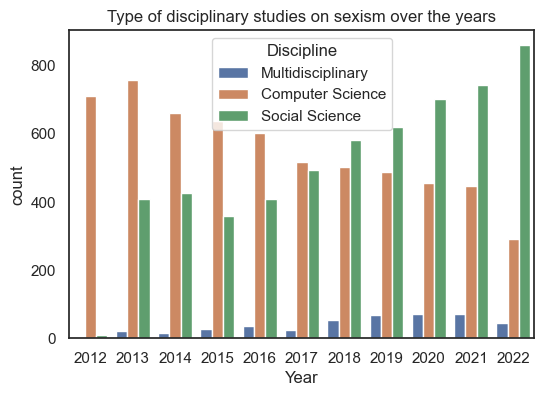

In [128]:
sns.countplot(x='Year',hue='Discipline',data=df)
sns.set(rc={'figure.figsize':(10,8)})
plt.title("Type of disciplinary studies on sexism over the years")

Text(0.5, 1.0, 'Count of open access studies on sexism over the years')

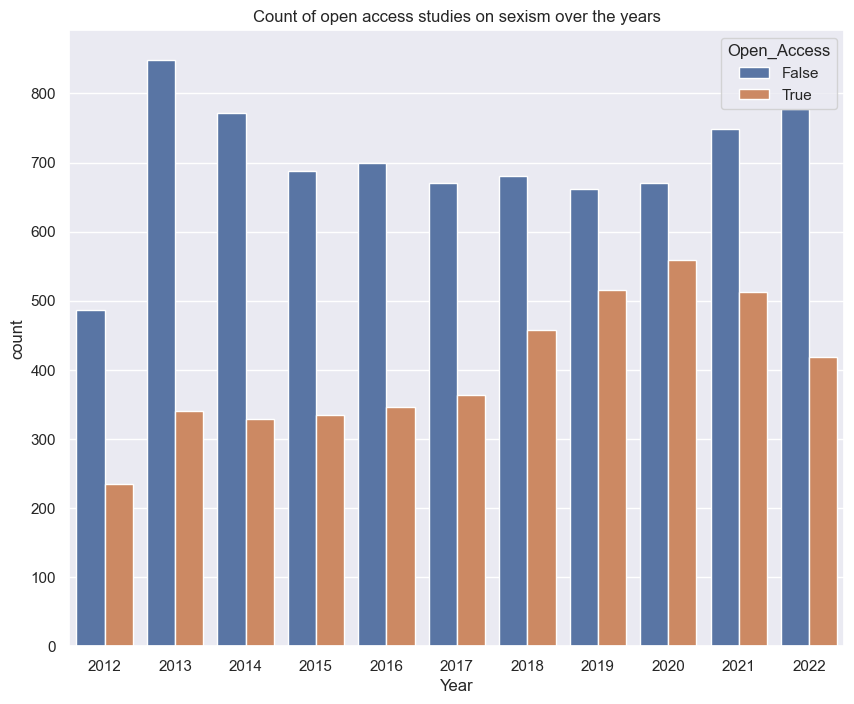

In [42]:
sns.countplot(x='Year',hue='Open_Access',data=df)
sns.set(rc={'figure.figsize':(6,4)})
plt.title("Count of open access studies on sexism over the years")

In [43]:
df['Discipline'].value_counts()

Computer Science     6074
Social Science       5614
Multidisciplinary     428
Name: Discipline, dtype: int64

## Separating the dataframes, as per the disciplines

In [44]:
df_cs = df[df['Discipline'] == 'Computer Science'].reset_index(drop=True)
df_ss = df[df['Discipline'] == 'Social Science'].reset_index(drop=True)

In [45]:
df_mult = df[df['Discipline'] == 'Multidisciplinary'].reset_index(drop=True)
df_mult

,Title,Abstract,Venue,Year,Open_Access,fieldsOfStudy,Publication_Type,authors,Discipline
0,Wearing Many (Social) Hats: How Different Are ...,This paper investigates when users create prof...,International Conference on Web and Social Media,2017,True,"Computer Science, Psychology",JournalArticle,C. Zhong; H. Chang; D. Karamshuk; D. Lee; N. R...,Multidisciplinary
1,PhenoScanner: a database of human genotype–phe...,Abstract Summary: PhenoScanner is a curated da...,Bioinform.,2016,True,"Political Science, Medicine, Computer Science","JournalArticle, Book",J. R. Staley; J. A. Blackshaw; M. Kamat; S. El...,Multidisciplinary
2,Intra-Class Variation Reduction Using Training...,Automatic facial expression recognition (FER) ...,IEEE Transactions on Affective Computing,2014,False,"Psychology, Computer Science","JournalArticle, Book",S. Lee; K. Plataniotis; Y. M. Ro,Multidisciplinary
3,Funding acknowledgment analysis: Queries and c...,Thomson Reuters's Web of Science (WoS) began s...,J. Assoc. Inf. Sci. Technol.,2016,True,"Political Science, Computer Science","JournalArticle, Book",L. Tang; G. Hu; W. Liu,Multidisciplinary
4,Competent Men and Warm Women: Gender Stereotyp...,There is much concern about algorithms that un...,International Conference on Human Factors in C...,2017,True,"Psychology, Computer Science","JournalArticle, Book",J. Otterbacher; J. Bates; P. D. Clough,Multidisciplinary
...,...,...,...,...,...,...,...,...,...
423,Gendered behavior as a disadvantage in open so...,Women are severely marginalized in software de...,NaN,2019,True,Mathematics; Mathematical Methods In Social Sc...,JournalArticle,B. Vedres; O. Vasarhelyi,Multidisciplinary
424,Probing the Impact of Gender-Affirming Hormone...,Evidence suggests that women outperform men in...,NaN,2020,False,Behavioral Sciences; Food Science & Technology...,JournalArticle,G. S. Kranz; U. Kaufmann; R. Lanzenberger,Multidisciplinary
425,"Team Combat Identification: Effects of Gender,...",Objective The combat identification (CID) abil...,NaN,2021,False,Behavioral Sciences; Engineering; Psychology,JournalArticle,A. L. Baker; J. R. Keebler; E. C. Anania; D. S...,Multidisciplinary
426,Odor Identification Performance in Idiopathic ...,Deficits in olfaction are among the most frequ...,NaN,2019,True,Behavioral Sciences; Food Science & Technology...,JournalArticle,M. Melis; G. Sollai; C. Masala; C. Pisanu; G. ...,Multidisciplinary


## Keyword co-occurence

In [122]:
# For cleaning the text
def remove_uns(text):
    text = str(text)
    #text = text.capitalize()
    text= text.replace('{html}',"") 
    cleanr = re.compile('<.*?>')
    cleantext = re.sub(cleanr, '', text)
    text= re.sub(r'http\S+', '',cleantext)
    text = re.sub('[0-9]+', '', text)
    text = text.capitalize()
    tokens = nltk.word_tokenize(text) #tokenize
    text = [w for w in tokens if w.isalpha()]  
    #stops = set(stopwords.words("english")) #eliminate stopwords
    text = [word for word in text if not word in stopwords]
    return ( " ".join(text)) #rejoin the words


# Using the same model as we used so far
kw_model = KeyBERT(model='all-mpnet-base-v2')

def extraction(text):
    keywords = kw_model.extract_keywords(text, 
                                     keyphrase_ngram_range=(1, 3), 
                                     stop_words='english', 
                                     highlight=False,
                                     top_n=5)
    listed_keys= []
    for i in keywords:
        listed_keys.append(str(i[0]))
    return listed_keys


# Function to couple the terms
def coupling_terms(list_):
    res= [(j,i) for i in list_ for j in list_ if j not in i 
       if set(j.split('_')[1:]) < set(i.split('_'))][::2]
    return res

### Computer Science

In [ ]:
#df_cs['clean_abstract'] = df_cs['Abstract'].apply(remove_uns) ## Takes a lot of time, if data is large
df_cs['keywords'] = df_cs['Abstract'].apply(extraction)

In [ ]:
# Remove collection words
collection_words = ['ai', 'artificial intelligence', 'natural language', 'natural language processing', 'language processing',
                   'nlp', 'machine learning', 'learning', 'deep learning', 'artificial intelligence', 
                    'artificial intelligence ai', 'ai intelligence', 'intelligence ai', 'intelligence'
                   'ml', 'dl', 'ellen wachtel', 'driven recommendation', 'facebook ai', 'database queries', 'sql', 'database', 'queries',
                   'code snippet']

def remove_words(list_):
    temp_list = []
    intersect = set(list_).intersection(collection_words)
    for i in list_:
        if i in intersect:
            continue
        else:
            temp_list.append(i)
    return temp_list

df_cs['coupled_keywords'] = df_cs['keywords'].apply(remove_words)
df_cs['coupled_keywords'] = df_cs['coupled_keywords'].apply(coupling_terms)
df_cs['coupled_keywords']

In [ ]:
terms_b= df_cs['coupled_keywords'] 
bigrams_comp = list(chain.from_iterable(terms_b)) #list(itertools.chain(*terms_b))

# Create counter of words in clean bigrams
bigram_counts_comp = collections.Counter(bigrams_comp)

bigram_df_comp = pd.DataFrame(bigram_counts_comp.most_common(50),
                             columns=['bigram', 'count'])

d = bigram_df_comp.set_index('bigram').T.to_dict('records')

# Create network plot 
G = nx.Graph()

# Create connections between nodes
for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))
    degree = dict(G.degree)

#G.add_node("sexism", weight=100)

color_lookup = {k:v for v, k in enumerate(sorted(set(G.nodes())))}

low, *_, high = sorted(color_lookup.values())
norm = mpl.colors.Normalize(vmin=low, vmax=high, clip=True)
mapper = mpl.cm.ScalarMappable(norm=norm, cmap=mpl.cm.coolwarm)


fig, ax = plt.subplots(figsize=(10, 10))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=10,
                 width=[v * 1 for v in degree.values()],
                 edge_color='grey',
                 node_color= [mapper.to_rgba(i) 
                    for i in color_lookup.values()],           #'purple',
                 nodelist=degree.keys(), node_size=[v * 100 for v in degree.values()],
                 with_labels = False,
                 ax=ax)

# Create offset labels
for key, value in pos.items():
    x, y = value[0]+.03, value[1]+.02
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='grey', alpha=0.25),
            horizontalalignment='center', fontsize=10, weight='bold')
    
#plt.savefig('images/keywords_co-occurrence_cs.png')
plt.show()

#### Multidisciplinary

In [ ]:
G = nx.karate_club_graph()
communities = girvan_newman(G)

node_groups = []
for com in next(communities):
    node_groups.append(list(com))

## Topic Modeling

### BerTopic

#### Creating representation models


#### 
- UMAP is a fairly flexible non-linear dimension reduction algorithm. It seeks to learn the manifold structure of your data and find a low dimensional embedding that preserves the essential topological structure of that manifold.
    - n_neighbors: calculate the density of correlated points: a very low value (ex:2) will have as very concentrated clusters, whereas a very high value (ex: 200) will have very sparse clusters. The best value would be something in between (maybe 50 or 100). As n_neighbors is increased UMAP manages to see more of the overall structure of the data, gluing more components together, and better coverying the broader structure of the data. 
    - min_dist: "min_dist" is the minimal distance between points in the lower dimension, generally speaking, it should be 0.0 if you want clear clusters. The default value for min_dist (as used above) is 0.1. It has a range of values from 0.0 through to 0.99.
    - n_components: This option that allows the user to determine the dimensionality of the reduced dimension space we will be embedding the data into. Unlike some other visualisation algorithms such as t-SNE, UMAP scales well in the embedding dimension, so you can use it for more than just visualisation in 2- or 3-dimensions. As mentioned, there is really no requirement to stop at n_components=3. If you are interested in (density based) clustering, or other machine learning techniques, it can be beneficial to pick a larger embedding dimension (say 10, or 50) closer to the the dimension of the underlying manifold on which your data lies.
    - metric: This controls how distance is computed in the ambient space of the input data. Angular and correlation metrics - cosine, correlation
- HDBscan: As a default, BERTopic uses HDBSCAN to perform its clustering. To use a HDBSCAN model with custom parameters, we can define it and pass it to BERTopic through 'hdbscan_model'
- k-Means clustering: 
- Use a KeyBERT-like model to fine-tune the topic representations
    - top_n_words: The top n words to extract per topic.
    - nr_repr_docs: The number of representative documents to extract per cluster.
    - 
- MMR ranking provides a useful way to present information to the user that is not redundant. It considers the similarity of keyphrase with the document, along with the similarity of already selected phrases.
    - diversity: How diverse the select keywords/keyphrases are. Values range between 0 and 1 with 0 being not diverse at all and 1 being most diverse.
    - top_n_words: The number of keywords/keyhprases to return
- 

#### Computer Science

In [191]:
# Create representation models
keybert_model = KeyBERTInspired(top_n_words=50, nr_repr_docs= 10, random_state=1234)
mmr_model = MaximalMarginalRelevance(diversity=0.5)
pos_patterns = [
            [{'POS': 'ADJ'}, {'POS': 'NOUN'}],
            [{'POS': 'NOUN'}], [{'POS': 'ADJ'}]
]
# DEFAULT_PATTERNS = [ [{'POS': 'ADJ'}, {'POS': 'NOUN'}], [{'POS': 'NOUN'}], [{'POS': 'ADJ'}] ]
pos_model = PartOfSpeech("en_core_web_sm", pos_patterns=pos_patterns) 

representation_models = [pos_model, keybert_model, mmr_model]

ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)

#word_model = api.load('fasttext-wiki-news-subwords-300')
sentence_model = SentenceTransformer("all-mpnet-base-v2") # all-MiniLM-L6-v2
#word_doc_embedder = WordDocEmbedder(embedding_model=sentence_model, word_embedding_model=word_model)
embeddings_comp = sentence_model.encode(df_cs['Abstract'].to_list(), show_progress_bar=True)

Batches:   0%|          | 0/190 [00:00<?, ?it/s]

In [192]:
umap_model = umap.UMAP(n_neighbors=50, n_components=80, min_dist=0.0, metric='cosine', random_state=1234)
#vectorizer_model = CountVectorizer(stop_words="english")
vectorizer_model = TfidfVectorizer()
cluster_model = KMeans(n_clusters=5)

#reduced_embeddings_comp = umap.UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings_comp)

topic_model_comp = BERTopic(
    language='english', # Set to 'multilingual' for datasets with languages other than English. # a few other languages set so changing from 'english'
    top_n_words=30,
    n_gram_range=(1, 3),
    #min_topic_size=10,
    nr_topics= 'auto',
    low_memory=False,
    calculate_probabilities=True, # The probabilities of all topics per document.
    representation_model=representation_models,
    embedding_model=sentence_model,
    hdbscan_model= cluster_model, 
    umap_model=umap_model, 
    vectorizer_model=vectorizer_model,
    ctfidf_model=ctfidf_model
)

In [193]:
topics_comp, probs_comp = topic_model_comp.fit_transform(df_cs['Abstract'].to_list(), embeddings_comp) #reduced_embeddings_comp

In [198]:
topic_model_comp.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,0,2618,0_databases_rdf_algorithm_skyline,"[databases, rdf, algorithm, skyline, index, pe...",[Important cloud services rely on spatial-keyw...
1,1,1430,1_ranking_web_retrieval_information,"[ranking, web, retrieval, information, neural,...",[Relevance is the most important factor to ass...
2,2,815,2_discrimination_cyberbullying_ai_classification,"[discrimination, cyberbullying, ai, classifica...","[During the last decade, hateful and sexist co..."
3,3,700,3_retrieval_datasets_segmentation_images,"[retrieval, datasets, segmentation, images, ne...",[The process of identifying the true anomalies...
4,4,511,4_encryption_confidentiality_security_data,"[encryption, confidentiality, security, data, ...",[With the proliferation of location-aware mobi...


In [199]:
'''
topics_change_comp = {0: 'Gender oppression', 1: 'Ambivalent sexism', 2: 'Gender discrimination', 
                      3: 'Sexism', 4: 'Feminist theories'}
'''

topics_change_comp = {0: 'Databases', 1: 'Web scrapping', 2: 'Gender-based hate speech', 
                      3: 'Information retrieval', 4: 'Miscellaneous'}

topic_model_comp.set_topic_labels(topics_change_comp)



In [168]:
topic_model_comp.visualize_barchart(topics=None, top_n_topics=5, n_words=10, custom_labels=True, width=350, height=350)

In [169]:
topic_model_comp.visualize_documents(df_cs['Abstract'].to_list(), custom_labels=True, width=750, height=500) 
                                     #,reduced_embeddings=reduced_embeddings_comp, 
                               # hide_document_hover=True, hide_annotations=True)

In [200]:
timestamps_cs = df_cs['Year']
docs_cs = df_cs['Abstract']

df_topics_cs = pd.DataFrame({'Abstract': docs_cs, 'Topic': topics_comp, 'Year': timestamps_cs})
df_topics_cs['index'] = df_topics_cs.index

df_cs_top_spread_0 = df_topics_cs[df_topics_cs['Topic'] == 0].drop(columns='Topic').rename(columns={'index': 'Databases'}).reset_index(drop=True)
df_cs_top_spread_1 = df_topics_cs[df_topics_cs['Topic'] == 1].drop(columns='Topic').rename(columns={'index': 'Web scrapping'}).reset_index(drop=True)
df_cs_top_spread_2 = df_topics_cs[df_topics_cs['Topic'] == 2].drop(columns='Topic').rename(columns={'index': 'Gender-based hate speech'}).reset_index(drop=True)
df_cs_top_spread_3 = df_topics_cs[df_topics_cs['Topic'] == 3].drop(columns='Topic').rename(columns={'index': 'Information retrieval'}).reset_index(drop=True)
df_cs_top_spread_4 = df_topics_cs[df_topics_cs['Topic'] == 4].drop(columns='Topic').rename(columns={'index': 'Miscellaneous'}).reset_index(drop=True)


In [201]:
topics_over_time_cs = topic_model_comp.topics_over_time(docs_cs, timestamps_cs)
topic_model_comp.visualize_topics_over_time(topics_over_time_cs, top_n_topics=10, custom_labels=True, width=1000, height=450)

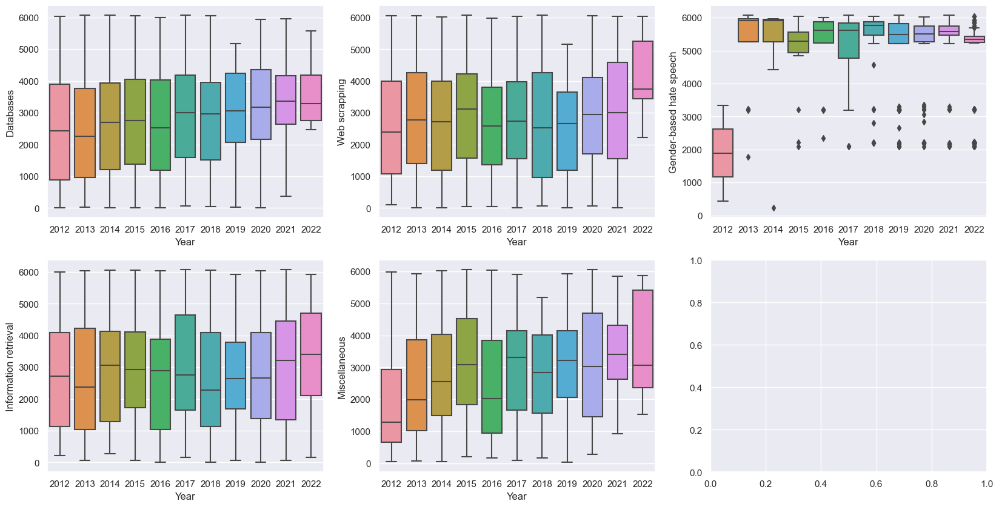

In [174]:
fig, axes = plt.subplots(2, 3, figsize=(20, 10))

#fig.suptitle('Topic distribution by year')

sns.boxplot(ax=axes[0, 0], data=df_cs_top_spread_0, x='Year', y='Databases')
sns.boxplot(ax=axes[0, 1], data=df_cs_top_spread_1, x='Year', y='Web scrapping')
sns.boxplot(ax=axes[0, 2], data=df_cs_top_spread_2, x='Year', y='Gender-based hate speech')
sns.boxplot(ax=axes[1, 0], data=df_cs_top_spread_3, x='Year', y='Information retrieval')
sns.boxplot(ax=axes[1, 1], data=df_cs_top_spread_4, x='Year', y='Miscellaneous')

plt.show()

### Social Science

In [85]:
umap_model = umap.UMAP(n_neighbors=50, n_components=80, min_dist=0.0, metric='cosine', random_state=1234)
#hdbscan_model = HDBSCAN(min_cluster_size=50, metric='euclidean', 
#                       cluster_selection_method='eom', prediction_data=True, min_samples=20)
cluster_model = KMeans(n_clusters=20) #If used instead of hdbscan
#vectorizer_model = CountVectorizer(stop_words="english")
#vectorizer_model = TfidfVectorizer()
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)
#word_model = api.load('fasttext-wiki-news-subwords-300')
sentence_model = SentenceTransformer("all-mpnet-base-v2") # all-MiniLM-L6-v2
#word_doc_embedder = WordDocEmbedder(embedding_model=sentence_model, word_embedding_model=word_model)
embeddings_soc = sentence_model.encode(df_ss['Abstract'].to_list(), show_progress_bar=True)

# Create representation models
keybert_model = KeyBERTInspired(top_n_words=50, nr_repr_docs= 10, random_state=1234)
mmr_model = MaximalMarginalRelevance(diversity=0.1)
pos_patterns = [
            [{'POS': 'ADJ'}, {'POS': 'NOUN'}],
            [{'POS': 'NOUN'}], [{'POS': 'ADJ'}]
]
pos_model = PartOfSpeech("en_core_web_sm", pos_patterns=pos_patterns) 

representation_models = [pos_model, keybert_model, mmr_model]

# We reduce our embeddings to 2D as it will allows us to quickly iterate later on
#reduced_embeddings_soc = umap.UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings_soc)

topic_model_soc = BERTopic(
    language='english', # Set to 'multilingual' for datasets with languages other than English. # selected only the english ones
    top_n_words=30,
    n_gram_range=(1, 3),
    min_topic_size=50,
    nr_topics= 'auto',
    embedding_model=sentence_model,
    low_memory=False,
    calculate_probabilities=True, # The probabilities of all topics per document.
    representation_model=representation_models,
    umap_model=umap_model, 
    #vectorizer_model=vectorizer_model,
    hdbscan_model= cluster_model, #hdbscan_model
    ctfidf_model=ctfidf_model
)

Batches:   0%|          | 0/176 [00:00<?, ?it/s]

In [86]:
topics_soc, probs_soc = topic_model_soc.fit_transform(df_ss['Abstract'].to_list(), embeddings_soc)  #reduced_embeddings_soc 

In [87]:
topic_model_soc.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,0,1922,0_feminism_feminist_misogyny_sexism,"[feminism, feminist, misogyny, sexism, of wome...","[In 1898, S. J. “Mack” McCray, along with one ..."
1,1,1426,1_sexism and_sexism_hostile sexism_discrimination,"[sexism and, sexism, hostile sexism, discrimin...","[Across four studies, we examine multiple iden..."
2,2,363,2_literary_of women_feminist_misogyny,"[literary, of women, feminist, misogyny, theol...",[Migrating from Greek mythology to scripture a...
3,3,353,3_violence against women_intimate partner viol...,"[violence against women, intimate partner viol...",[Background: Sexual violence exists everywhere...
4,4,341,4_mental health_disorders_discrimination and_t...,"[mental health, disorders, discrimination and,...",[The problem of tobacco smoking in Russian Fed...
5,5,300,5_sexual minority_lgbtq_lgbt_transgender,"[sexual minority, lgbtq, lgbt, transgender, se...","[Introduction: In Canada, individuals living i..."
6,6,212,6_gender stereotypes_sexist attitudes_gender_s...,"[gender stereotypes, sexist attitudes, gender,...","[The presence, magnitude, and significance of ..."
7,7,171,7_medical students_gender bias_female students...,"[medical students, gender bias, female student...",[OBJECTIVE: This study analyzed the linguistic...
8,8,168,8_female athletes_sexism and_the sport_sport,"[female athletes, sexism and, the sport, sport...",[As the world is racing to find a cure to save...
9,9,140,9_linguistic sexism_sexist language_gender fai...,"[linguistic sexism, sexist language, gender fa...",[The aim of this study was to find out how peo...


In [88]:
topic_model_soc.generate_topic_labels()

['0_feminism_feminist_misogyny',
 '1_sexism and_sexism_hostile sexism',
 '2_literary_of women_feminist',
 '3_violence against women_intimate partner violence_sexual violence',
 '4_mental health_disorders_discrimination and',
 '5_sexual minority_lgbtq_lgbt',
 '6_gender stereotypes_sexist attitudes_gender',
 '7_medical students_gender bias_female students',
 '8_female athletes_sexism and_the sport',
 '9_linguistic sexism_sexist language_gender fair language',
 '10_sexism_benevolent sexism_sexist',
 '11_female gamers_gaming culture_violent video games']

In [156]:
'''
topics_change_soc = {0: 'Sexist attitudes', 1:'Sexism and racism', 2:'Linguistics of sexism', 3:'Sexism and intersectionality',
                     4: 'Sexism and color', 5:'Queer studies', 6:'Feminist media', 7:'Sexism in technology',
                     8:'Sexism in advertising', 9:'Rape myths', 10:'Ambivalent sexism', 11:'Gender violence',
                     12:'Gender inequality', 13:'Sexism in politics', 14:'Speciecism', 15:'Sexism in sports',
                     16:'Radical feminist thoery', 17:'Sexism and ageism', 18:'Sexism and religion', 19:'Sexism in gaming'}
'''
topics_change_soc = {0:'Feminism with misogyny/sexism', 1:'Hostile sexism', 2:'Feminist media', 3:'Gender violence',
                     4: 'Sexism and color', 5:'Queer studies', 6:'Gender stereotype', 7:'Gender inequality',
                     8:'Sexism in sports', 9:'Linguistics of sexism', 10:'Benevolent sexism', 11:'Sexism in gaming'}
                     
topic_model_soc.set_topic_labels(topics_change_soc)


In [157]:
topic_model_soc.visualize_barchart(topics=None, top_n_topics=10, n_words=10, custom_labels=True, width=350, height=350)

In [158]:
topic_model_soc.visualize_documents(df_ss['Abstract'].to_list(), custom_labels=True, width=750, height=500)
# reduced_embeddings=reduced_embeddings_soc, hide_document_hover=True, hide_annotations=True,

In [159]:
timestamps_ss = df_ss['Year']
docs_ss = df_ss['Abstract']

topics_over_time_ss = topic_model_soc.topics_over_time(docs_ss, timestamps_ss)
topic_model_soc.visualize_topics_over_time(topics_over_time_ss, top_n_topics=10, custom_labels=True, width=1000, height=450)

In [160]:
df_topics_ss = pd.DataFrame({'Abstract': docs_ss, 'Topic': topics_soc, 'Year': timestamps_ss})
df_topics_ss['index'] = df_topics_ss.index
#df_ss_top_spread = df_topics_ss.groupby(['Year','Topic'])['index'].count().reset_index(name='count')

df_ss_top_spread_0 = df_topics_ss[df_topics_ss['Topic'] == 0].drop(columns='Topic').rename(columns={'index': 'Feminism with misogyny/sexism'}).reset_index(drop=True)
df_ss_top_spread_1 = df_topics_ss[df_topics_ss['Topic'] == 1].drop(columns='Topic').rename(columns={'index': 'Hostile sexism'}).reset_index(drop=True)
df_ss_top_spread_2 = df_topics_ss[df_topics_ss['Topic'] == 2].drop(columns='Topic').rename(columns={'index': 'Feminist media'}).reset_index(drop=True)
df_ss_top_spread_3 = df_topics_ss[df_topics_ss['Topic'] == 3].drop(columns='Topic').rename(columns={'index': 'Gender violence'}).reset_index(drop=True)
df_ss_top_spread_4 = df_topics_ss[df_topics_ss['Topic'] == 4].drop(columns='Topic').rename(columns={'index': 'Sexism and color'}).reset_index(drop=True)
df_ss_top_spread_5 = df_topics_ss[df_topics_ss['Topic'] == 5].drop(columns='Topic').rename(columns={'index': 'Queer studies'}).reset_index(drop=True)
df_ss_top_spread_6 = df_topics_ss[df_topics_ss['Topic'] == 6].drop(columns='Topic').rename(columns={'index': 'Gender stereotype'}).reset_index(drop=True)
df_ss_top_spread_7 = df_topics_ss[df_topics_ss['Topic'] == 7].drop(columns='Topic').rename(columns={'index': 'Gender inequality'}).reset_index(drop=True)
df_ss_top_spread_8 = df_topics_ss[df_topics_ss['Topic'] == 8].drop(columns='Topic').rename(columns={'index': 'Sexism in sports'}).reset_index(drop=True)
df_ss_top_spread_9 = df_topics_ss[df_topics_ss['Topic'] == 9].drop(columns='Topic').rename(columns={'index': 'Linguistics of sexism'}).reset_index(drop=True)
df_ss_top_spread_10 = df_topics_ss[df_topics_ss['Topic'] == 10].drop(columns='Topic').rename(columns={'index': 'Benevolent sexism'}).reset_index(drop=True)
df_ss_top_spread_11 = df_topics_ss[df_topics_ss['Topic'] == 11].drop(columns='Topic').rename(columns={'index': 'Sexism in gaming'}).reset_index(drop=True)


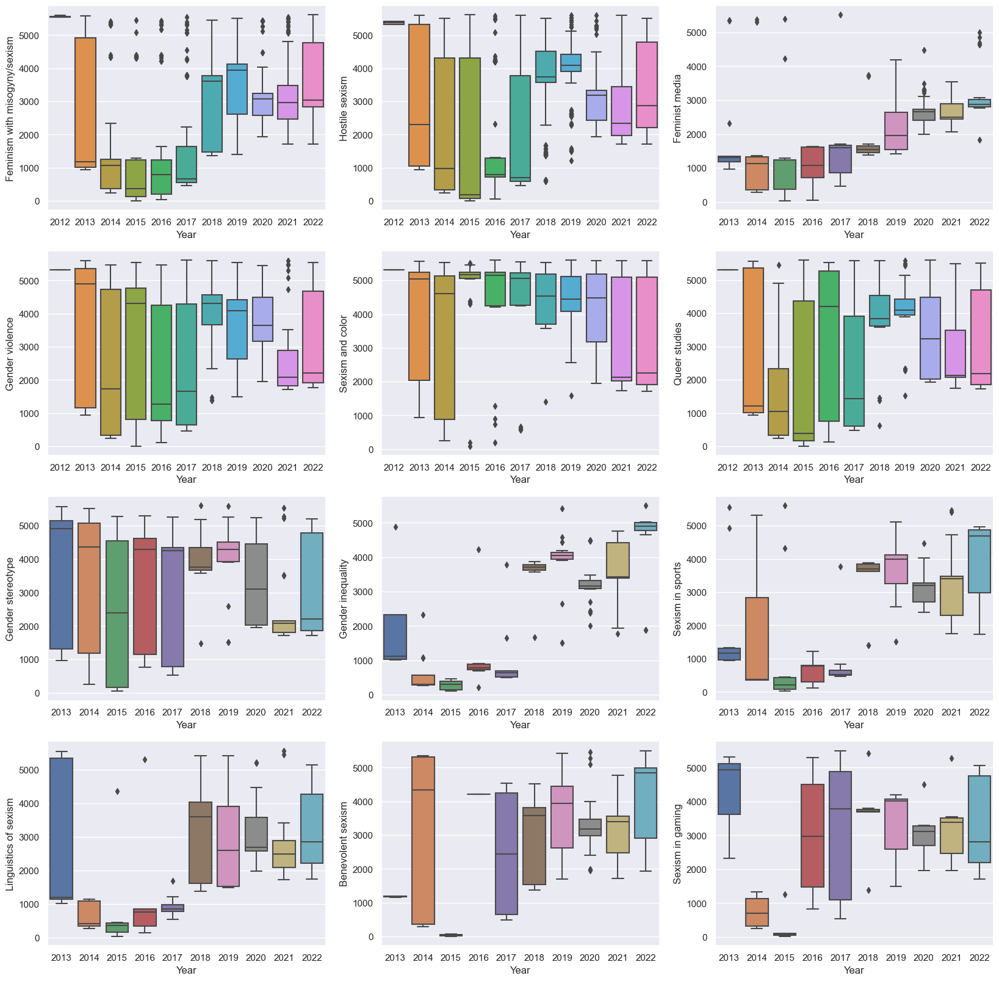

In [161]:
fig, axes = plt.subplots(4, 3, figsize=(20, 20))

#fig.suptitle('Topic distribution by year')

sns.boxplot(ax=axes[0, 0], data=df_ss_top_spread_0, x='Year', y='Feminism with misogyny/sexism')
sns.boxplot(ax=axes[0, 1], data=df_ss_top_spread_1, x='Year', y='Hostile sexism')
sns.boxplot(ax=axes[0, 2], data=df_ss_top_spread_2, x='Year', y='Feminist media')
sns.boxplot(ax=axes[1, 0], data=df_ss_top_spread_3, x='Year', y='Gender violence')
sns.boxplot(ax=axes[1, 1], data=df_ss_top_spread_4, x='Year', y='Sexism and color')
sns.boxplot(ax=axes[1, 2], data=df_ss_top_spread_5, x='Year', y='Queer studies')
sns.boxplot(ax=axes[2, 0], data=df_ss_top_spread_6, x='Year', y='Gender stereotype')
sns.boxplot(ax=axes[2, 1], data=df_ss_top_spread_7, x='Year', y='Gender inequality')
sns.boxplot(ax=axes[2, 2], data=df_ss_top_spread_8, x='Year', y='Sexism in sports')
sns.boxplot(ax=axes[3, 0], data=df_ss_top_spread_9, x='Year', y='Linguistics of sexism')
sns.boxplot(ax=axes[3, 1], data=df_ss_top_spread_10, x='Year', y='Benevolent sexism')
sns.boxplot(ax=axes[3, 2], data=df_ss_top_spread_11, x='Year', y='Sexism in gaming')

plt.show()

#### Multidisciplinary

In [83]:
# Create representation models
keybert_model = KeyBERTInspired(top_n_words=50, nr_repr_docs= 10, random_state=1234)
mmr_model = MaximalMarginalRelevance(diversity=0.0)
pos_patterns = [
            [{'POS': 'ADJ'}, {'POS': 'NOUN'}],
            [{'POS': 'NOUN'}], [{'POS': 'ADJ'}]
]
# DEFAULT_PATTERNS = [ [{'POS': 'ADJ'}, {'POS': 'NOUN'}], [{'POS': 'NOUN'}], [{'POS': 'ADJ'}] ]
pos_model = PartOfSpeech("en_core_web_sm", pos_patterns=pos_patterns) 

representation_models = [pos_model, keybert_model, mmr_model]

ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)

#word_model = api.load('fasttext-wiki-news-subwords-300')
sentence_model = SentenceTransformer("all-mpnet-base-v2") # all-MiniLM-L6-v2
#word_doc_embedder = WordDocEmbedder(embedding_model=sentence_model, word_embedding_model=word_model)
embeddings_mult = sentence_model.encode(df_mult['Abstract'].to_list(), show_progress_bar=True)

Batches:   0%|          | 0/14 [00:00<?, ?it/s]

In [100]:
umap_model = umap.UMAP(n_neighbors=60, n_components=100, min_dist=0.0, metric='cosine', random_state=1234)
#vectorizer_model = CountVectorizer(stop_words="english")
vectorizer_model = TfidfVectorizer()
cluster_model = KMeans(n_clusters=6)

#reduced_embeddings_comp = umap.UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings_comp)

topic_model_mult = BERTopic(
    language='english', # Set to 'multilingual' for datasets with languages other than English. # a few other languages set so changing from 'english'
    top_n_words=30,
    n_gram_range=(1, 3),
    #min_topic_size=10,
    nr_topics= 'auto',
    low_memory=False,
    calculate_probabilities=True, # The probabilities of all topics per document.
    representation_model=representation_models,
    embedding_model=sentence_model,
    hdbscan_model= cluster_model, 
    umap_model=umap_model, 
    vectorizer_model=vectorizer_model,
    ctfidf_model=ctfidf_model
)

In [101]:
topics_mult, probs_mult = topic_model_mult.fit_transform(df_mult['Abstract'].to_list(), embeddings_mult) #reduced_embeddings_comp

In [102]:
topic_model_mult.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,0,96,0_academia_researchers_stem_academic,"[academia, researchers, stem, academic, underr...",[There is extensive evidence of gender inequal...
1,1,83,1_biases_bias_social_facebook,"[biases, bias, social, facebook, media, ai, ro...",[Background Physical activity helps people mai...
2,2,77,2_sexism_discrimination_gender_stereotypes,"[sexism, discrimination, gender, stereotypes, ...",[This paper focuses on Charlotte Wood’s 2015 d...
3,3,76,3_abusive_hate_abuse_racism,"[abusive, hate, abuse, racism, classifiers, 4c...",[The freedom of expression given by social med...
4,4,64,4_discrimination_health_doctors_women,"[discrimination, health, doctors, women, gende...",[Background Evidence-based interventions are e...
5,5,32,5_olfactory_odors_genes_dna,"[olfactory, odors, genes, dna, genetic, specie...",[Mosquitoes are hematophagous insects that tra...


In [103]:
topics_change_mult = {0: 'Gender gap in academia', 1: 'Gender bias in social platforms', 2:'Gender stereotype', 
                     3: 'Gender-based violence', 4:'Gender inequality in health', 5:'Miscellaneous'}
                     
topic_model_mult.set_topic_labels(topics_change_mult)

In [104]:
topic_model_mult.visualize_barchart(topics=None, top_n_topics=20, n_words=10, custom_labels=True, width=350, height=350)

In [110]:
topic_model_mult.visualize_documents(df_mult['Abstract'].to_list(), custom_labels=True, width=780, height=500)

In [106]:
timestamps_mult = df_mult['Year']
docs_mult = df_mult['Abstract']

topics_over_time_mult = topic_model_mult.topics_over_time(docs_mult, timestamps_mult)
topic_model_mult.visualize_topics_over_time(topics_over_time_mult, top_n_topics=10, custom_labels=True, width=1000, height=450)

In [107]:
df_topics_mult = pd.DataFrame({'Abstract': docs_mult, 'Topic': topics_mult, 'Year': timestamps_mult})
df_topics_mult['index'] = df_topics_mult.index

df_mult_top_spread_0 = df_topics_mult[df_topics_mult['Topic'] == 0].drop(columns='Topic').rename(columns={'index': 'Gender gap in academia'}).reset_index(drop=True)
df_mult_top_spread_1 = df_topics_mult[df_topics_mult['Topic'] == 1].drop(columns='Topic').rename(columns={'index': 'Gender bias in social platforms'}).reset_index(drop=True)
df_mult_top_spread_2 = df_topics_mult[df_topics_mult['Topic'] == 2].drop(columns='Topic').rename(columns={'index': 'Gender stereotype'}).reset_index(drop=True)
df_mult_top_spread_3 = df_topics_mult[df_topics_mult['Topic'] == 3].drop(columns='Topic').rename(columns={'index': 'Gender-based violence'}).reset_index(drop=True)
df_mult_top_spread_4 = df_topics_mult[df_topics_mult['Topic'] == 4].drop(columns='Topic').rename(columns={'index': 'Gender inequality in health'}).reset_index(drop=True)
df_mult_top_spread_5 = df_topics_mult[df_topics_mult['Topic'] == 5].drop(columns='Topic').rename(columns={'index': 'Miscellaneous'}).reset_index(drop=True)


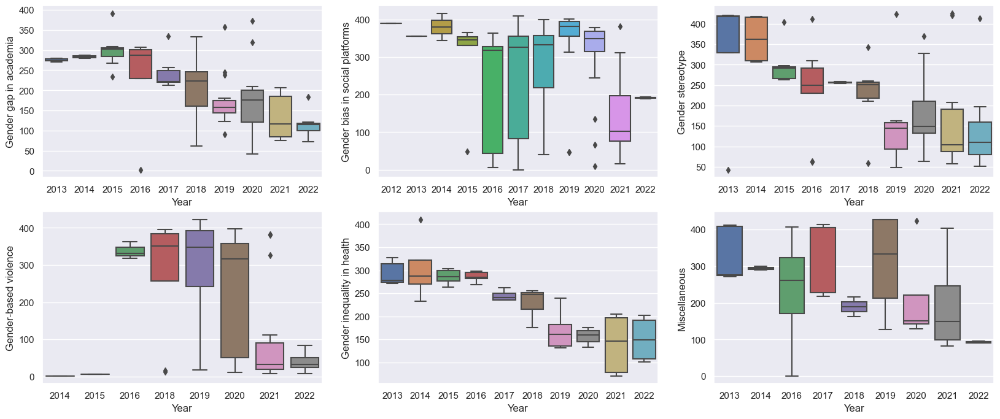

In [109]:
fig, axes = plt.subplots(2, 3, figsize=(20, 8))

#fig.suptitle('Topic distribution by year')

sns.boxplot(ax=axes[0, 0], data=df_mult_top_spread_0, x='Year', y='Gender gap in academia')
sns.boxplot(ax=axes[0, 1], data=df_mult_top_spread_1, x='Year', y='Gender bias in social platforms')
sns.boxplot(ax=axes[0, 2], data=df_mult_top_spread_2, x='Year', y='Gender stereotype')
sns.boxplot(ax=axes[1, 0], data=df_mult_top_spread_3, x='Year', y='Gender-based violence')
sns.boxplot(ax=axes[1, 1], data=df_mult_top_spread_4, x='Year', y='Gender inequality in health')
sns.boxplot(ax=axes[1, 2], data=df_mult_top_spread_5, x='Year', y='Miscellaneous')

plt.show()

## Top2Vec

Top2Vec is an algorithm for topic modeling and semantic search. It automatically detects topics present in text and generates jointly embedded topic, document and word vectors.

#### Computer Science

In [204]:
docs_cs = df_cs.Abstract.tolist()
model_cs = Top2Vec(docs_cs, ngram_vocab=True) # , embedding_model='universal-sentence-encoder'

2023-07-16 00:59:50,809 - top2vec - INFO - Pre-processing documents for training
2023-07-16 00:59:50,809 : INFO : Pre-processing documents for training
2023-07-16 00:59:52,343 - top2vec - INFO - Creating joint document/word embedding
2023-07-16 00:59:52,343 : INFO : Creating joint document/word embedding
2023-07-16 01:00:35,378 - top2vec - INFO - Creating lower dimension embedding of documents
2023-07-16 01:00:35,378 : INFO : Creating lower dimension embedding of documents
2023-07-16 01:00:39,681 - top2vec - INFO - Finding dense areas of documents
2023-07-16 01:00:39,681 : INFO : Finding dense areas of documents
2023-07-16 01:00:39,787 - top2vec - INFO - Finding topics
2023-07-16 01:00:39,787 : INFO : Finding topics


topic_sizes: The number of documents most similar to each topic.

topic_nums: The unique index of every topic will be returned.

In [205]:
topic_sizes_ngram_cs, topic_nums_ngram_cs = model_cs.get_topic_sizes()

In [211]:
topic_nums_ngram_cs

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70])

In [209]:
topic_words_ngram_cs, word_scores_ngram_cs, topics_ngram_cs = model_cs.get_topics()
for words, scores, num in zip(topic_words_ngram_cs, word_scores_ngram_cs, topics_ngram_cs):
    print(f"Topic {num}")
    for word, score in zip(words, scores):
        print(word, score)

Topic 0
hate 0.55872965
media 0.49587435
sexism 0.4842153
abusive 0.48089412
hateful 0.4787584
misogyny 0.4765216
spanish 0.47143844
gender 0.46846387
offensive 0.4658765
speech 0.46520966
racism 0.45388559
women 0.44224933
society 0.43060052
sexist 0.42624414
misogynous 0.42565763
comments 0.41317487
reserved 0.41006497
sexual 0.40936095
misogynistic 0.4090647
toxic 0.40671816
like twitter 0.40580687
toxicity 0.40570468
memes 0.40201616
social 0.3967852
tweets 0.39480263
stereotypes 0.39268276
violence 0.39119485
harassment 0.38816255
participation 0.38603517
cultural 0.38233486
this article 0.3748721
men 0.37371522
female 0.37278605
twitter 0.36584917
detecting misogyny 0.3652279
male 0.36270773
copyright john 0.35985532
copyright held 0.35985
twitter posts 0.3587763
race 0.35852164
automatic misogyny 0.35726804
rights 0.35567293
biases 0.34723616
copyright for 0.34358636
human rights 0.34210044
cyberbullying 0.33989912
italian tweets 0.33820844
education 0.33665273
focuses on 0.3331

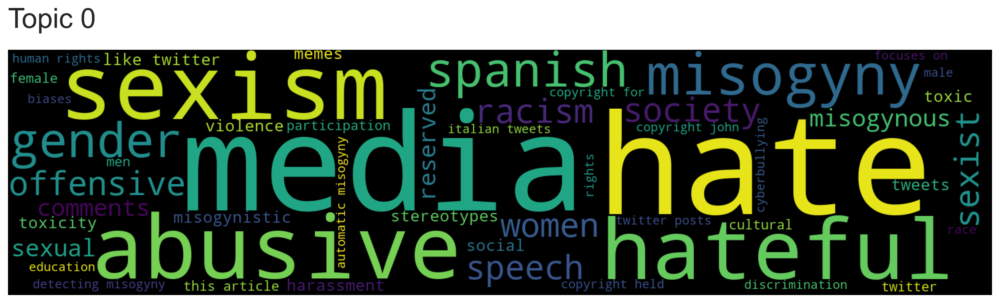

In [212]:
model_cs.generate_topic_wordcloud(0)

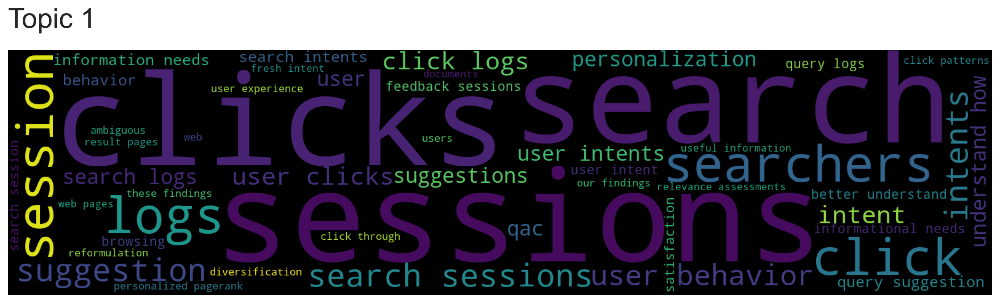

In [214]:
model_cs.generate_topic_wordcloud(1)

In [224]:
model_cs.get_num_topics()

71

### Mulidisciplinary

In [113]:
docs_mult = df_mult.Abstract.tolist()
model_mult = Top2Vec(docs_mult, ngram_vocab=True)

2023-07-16 16:09:16,940 - top2vec - INFO - Pre-processing documents for training
2023-07-16 16:09:16,940 : INFO : Pre-processing documents for training
2023-07-16 16:09:17,103 - top2vec - INFO - Creating joint document/word embedding
2023-07-16 16:09:17,103 : INFO : Creating joint document/word embedding
2023-07-16 16:09:18,640 - top2vec - INFO - Creating lower dimension embedding of documents
2023-07-16 16:09:18,640 : INFO : Creating lower dimension embedding of documents
2023-07-16 16:09:20,279 - top2vec - INFO - Finding dense areas of documents
2023-07-16 16:09:20,279 : INFO : Finding dense areas of documents
2023-07-16 16:09:20,299 - top2vec - INFO - Finding topics
2023-07-16 16:09:20,299 : INFO : Finding topics


In [114]:
topic_sizes_ngram_mult, topic_nums_ngram_mult = model_mult.get_topic_sizes()

In [115]:
topic_nums_ngram_mult

array([0, 1, 2])

In [117]:
topic_words_ngram_mult, word_scores_ngram_mult, topics_ngram_mult = model_mult.get_topics()
for words, scores, num in zip(topic_words_ngram_mult, word_scores_ngram_mult, topics_ngram_mult):
    print(f"Topic {num}")
    for word, score in zip(words, scores):
        print(word, score)

Topic 0
data 0.9917508
work 0.9873075
some 0.98620284
but 0.98349833
often 0.9831075
one 0.98237455
however 0.9823278
two 0.9783816
non 0.9780908
from 0.9776662
only 0.97724986
each 0.97691625
group 0.97688377
over 0.976221
present 0.9762178
found 0.97610766
provide 0.9759288
the 0.9753851
they 0.9746692
as 0.97462887
to 0.9736344
through 0.9731701
other 0.9722745
about 0.9720461
its 0.97111714
these 0.97111326
used 0.96970606
suggest 0.96911365
of 0.96878254
has 0.9684347
less likely 0.96826833
more 0.9680876
may 0.9678606
have 0.9673292
science technology 0.96664256
those 0.9653412
large scale 0.9645403
support 0.96450096
over time 0.9637526
public 0.9627438
do 0.9615122
when 0.96149737
all 0.9614156
are 0.96126777
methods 0.9612619
individuals 0.9611592
first 0.9602605
effects 0.9599448
including 0.9599227
how 0.95899284
Topic 1
al 0.9809197
academic 0.97984374
overall 0.97634643
identified 0.9741588
significantly 0.972336
most 0.96978945
whether 0.96917677
role 0.9686527
conducted 

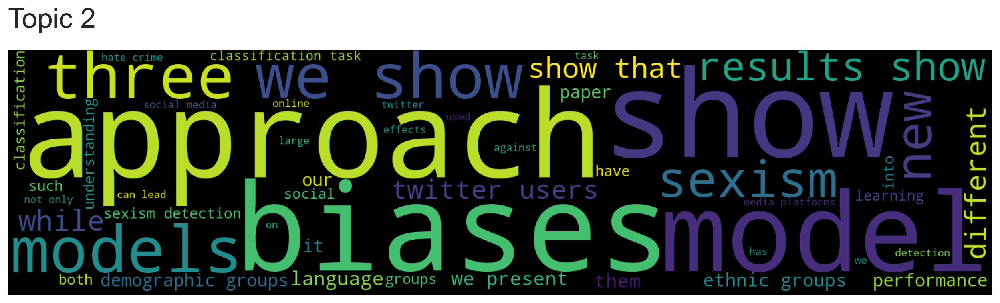

In [121]:
model_mult.generate_topic_wordcloud(2)

In [126]:
print(len(df1)), print(len(df2)), print(len(df3)), print(len(df4)), print(len(df5)), print(len(df6))

280
1381
1606
8520
9900
3965


(None, None, None, None, None, None)